# Trabajo final - ViT - CEIA

Noviembre - Diciembre 2024

Autores:

- Fabricio Denardi
- Valentín Pertierra
- Leandro Saraco
- Sofía Speri

> NOTA!!! Este código podría estar desactualizado.

> Por favor ver la version en Google Colab: https://colab.research.google.com/drive/1OMaSafYw9n4427QBn-sU5RV0k4FVfgfO

## Introducción

La tarea a resolver consiste en generar imágenes a partir de texto. Además, se realizará un fine-tuning para adaptar un modelo pre-entrenado a un estilo en particular. Se realizará una comparación de su funcionamiento antes y despues de este proceso. Para eso, no sólo se verá el cambio de estilo visualmente, sino que se usarán modelos como CLIP para obtener métricas apropiadas.


Basado en:

http://gitlab.taofen8.com/huangyh/diffusers/tree/3e3d46924b4fd1fa36ccbc5605ed619cdcc00dbf/examples/text_to_image


https://gist.github.com/loulblemo/80999d25d6a949c1042634f38feca28d

## Preparación de entorno y librerías

In [ ]:
%%capture
!pip install git+https://github.com/huggingface/diffusers.git
!pip install accelerate
!pip install datasets
!pip install bitsandbytes

In [ ]:
!pip install transformers

In [ ]:
import os
import torch

from diffusers import StableDiffusionPipeline
from diffusers import DiffusionPipeline

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

Preparación de carpetas para guardar pesos del modelo en Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
base_dir = '/content/drive/MyDrive/CEIA/ViT/TP_final/Stable_Difussion/'
vit_tp_dir = f"{base_dir}vit_tp"
wandb_dir = f"{base_dir}wandb"

os.makedirs(vit_tp_dir, exist_ok=True)
os.makedirs(wandb_dir, exist_ok=True)

In [ ]:
print(f"Modelo se guardará en: {vit_tp_dir}")

Modelo se guardará en: /content/drive/MyDrive/CEIA/ViT/TP_final/Stable_Difussion/vit_tp


## Elección del modelo

- Debido a las limitaciones de recursos computacionales se elige Stable Difussion Base.
- Este modelo consume aproximadamente 8GB de VRAM en inferencia y 15GB en entrenamiento.
- Link: https://huggingface.co/stabilityai/stable-diffusion-2-base
- Se usa el modelo pre-entrenado en el dataset LAION-5B.
  - LAION-5B es un conjunto masivo de imágenes y descripciones de texto obtenidas de internet. Su contenido es muy diverso y amplio.
  - Esto le permite al modelo generar imágenes detalladas y coherentes basadas en instrucciones textuales de diversas temáticas.

In [ ]:
%env MODEL_NAME=stabilityai/stable-diffusion-2-base

env: MODEL_NAME=stabilityai/stable-diffusion-2-base


### Función auxiliar: mostrar varias imágenes en una misma fila
Esta función se utilizará para ver distintos resultados de imágenes generadas a partir de un mismo prompt

In [ ]:
from matplotlib import pyplot as plt
def plot_images(images):  
    plt.figure()
    f, axarr = plt.subplots(1, len(images), figsize=(20,10))
    for ax, img in zip(axarr.flatten(), images):
        ax.imshow(img)
        ax.axis('off')
    plt.show()

### Carga del modelo base

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained(os.getenv('MODEL_NAME'), torch_dtype=torch.float16)
pipe = pipe.to("cuda")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/738 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/929 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/716 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.01k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

## Prueba del modelo base

- Le pedimos al modelo que genere un dibujo de una cebra y un mono en frente de una mansión y vemos 6 imágenes correspondientes a ese prompt.


In [ ]:
prompt = "A sketch of a zebra and a monkey in front of a mansion"
images = pipe(prompt, num_images_per_prompt=6).images

  0%|          | 0/50 [00:00<?, ?it/s]

<Figure size 640x480 with 0 Axes>

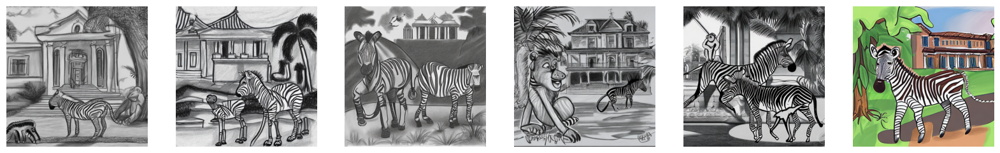

In [ ]:
plot_images(images)

Guardamos las imágenes para luego comparar con el modelo fine-tuned

In [ ]:
images_before_ft = images

Limpieza de todos los datos en la VRAM para contar con espacio suficiente para el fine tuning.

In [ ]:
del pipe
del images

In [ ]:
import gc
gc.collect()
torch.cuda.empty_cache()

## Fine-tuning

### Carga de dataset

- El dataset a usar para el finetuning consiste en dibujos hechos a lápiz en blanco y negro.

  - Link: https://huggingface.co/datasets/zoheb/sketch-scene
  - 10000 bosquejos hechos a mano hechos por 100 personas que no son expertas en dibujo.
  - El dataset se compone de pares [image,text]

- Se quiere ver el cambio de "estilo" entre las imagenes iniciales y luego del fine-tuning.

- Para poder realizar el entrenamiento de forma sencilla se descarga:
  - El dataset desde Huggingface.
  - Las librerias de diffusers.

In [ ]:
!git clone https://huggingface.co/datasets/zoheb/sketch-scene
!git clone https://github.com/huggingface/diffusers.git

Cloning into 'sketch-scene'...
remote: Enumerating objects: 58, done.
remote: Total 58 (delta 0), reused 0 (delta 0), pack-reused 58 (from 1)
Unpacking objects: 100% (58/58), 7.10 KiB | 558.00 KiB/s, done.
Cloning into 'diffusers'...
remote: Enumerating objects: 74758, done.
remote: Counting objects: 100% (1385/1385), done.
remote: Compressing objects: 100% (731/731), done.
remote: Total 74758 (delta 896), reused 938 (delta 536), pack-reused 73373 (from 1)
Receiving objects: 100% (74758/74758), 52.86 MiB | 26.40 MiB/s, done.
Resolving deltas: 100% (55286/55286), done.


### Definición de parámetros

In [ ]:
%%capture
%env dataset_name=sketch-scene
# No need to train the model for long to see meaningful results.
%env max_training_epochs = 30

### Uso de accelerate:

- Se utiliza _accelerate_ ya que permite manejar de forma simple:
  - Entrenamiento en GPU.
  - Uso de quantization.
  - Reporte a un gestor de métricas como Weight and Biases (wandb) o tensorflow.


### Optimizaciones para poder entrenar en Colab

Luego de varias iteraciones pudimos correr el entrenamiento en la versión gratuita de Colab usando una GPU T4. Se realizaron las siguientes optimizaciones:

- use_8bit_adam: Reduce la memoria consumida por el optimizador usando una versión con 8 bits de precisión.
- gradient_checkpointing: Reduce el uso de memoria durante entrenamiento forzando a recomputar activaciones intermedias solo cuando es necesario. Es más lento pero consume menos VRAM.
- mixed_precision="fp16": Utiliza mitad de la precisión que se usa normlamente (float 16 enves de float32). Así se reduce tanto memoria como tiempo de cómputo.
- use_ema: Usa una media movil exponencial (EMA) para los pesos del modelo, mejorando la generalización y estabilidad durante el entrenamiento.
- max_grad_norm=1: Hace clipping del gradiente para prevenir gradientes explosivos y mejorar estabilidad durante el training.

### Data augmentation y transformaciones
  - Se utiliza una resolución de 256x256 para menor consumo de memoria, además de ser la resolución nativa del dataset.
  - center_crop: Se recorta la imagen preservando el centro.
  - random_flip: Se hace un random horizontal flip con probabilidad del 50%.

In [ ]:
# Usar --use_8bit_adam es crucial para poder entrenar en una GPU T4 que tiene aproximadamente 16GB de VRAM.
!accelerate launch diffusers/examples/text_to_image/train_text_to_image.py \
  --pretrained_model_name_or_path=$MODEL_NAME \
  --dataset_name=$dataset_name \
  --image_column "image" \
  --caption_column "text" \
  --use_ema \
  --use_8bit_adam \
  --resolution=256 --center_crop --random_flip \
  --train_batch_size=4 \
  --gradient_accumulation_steps=4 \
  --gradient_checkpointing \
  --mixed_precision="fp16" \
  --max_train_steps=$max_training_epochs \
  --learning_rate=3e-05 \
  --max_grad_norm=1 \
  --lr_scheduler="constant" --lr_warmup_steps=0 \
  --output_dir="/content/drive/MyDrive/CEIA/ViT/TP_final/Stable_Difussion/vit_tp" \
  --validation_prompt=prompt  \
  --report_to="wandb"

The following values were not passed to `accelerate launch` and had defaults used instead:
	`--num_processes` was set to a value of `1`
	`--num_machines` was set to a value of `1`
	`--mixed_precision` was set to a value of `'no'`
	`--dynamo_backend` was set to a value of `'no'`
To avoid this warning pass in values for each of the problematic parameters or run `accelerate config`.
2024-11-26 00:20:07.154244: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-26 00:20:07.187259: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-26 00:20:07.197116: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has alread

### Almacenamiento de métricas de entrenamiento:

- Durante el entrenamiento se guardaron varias métricas de uso del sistema para poder garantizar que el modelo entre dentro de la VRAM disponible.
- El script usado con accelerate computa la función de pérdida "denoising loss", una forma de MSE.
- Se utiliza la plataforma wandb para facilitar esta tarea.#

In [ ]:
# Login en wandb

import wandb
wandb.init(project="stable_diffusion_finetune", dir=wandb_dir)

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: sofia-speri (sofia-speri-universidad-de-buenos-aires). Use `wandb login --relogin` to force relogin


Levantamos los datos de wandb para plotear loss por época en el notebook

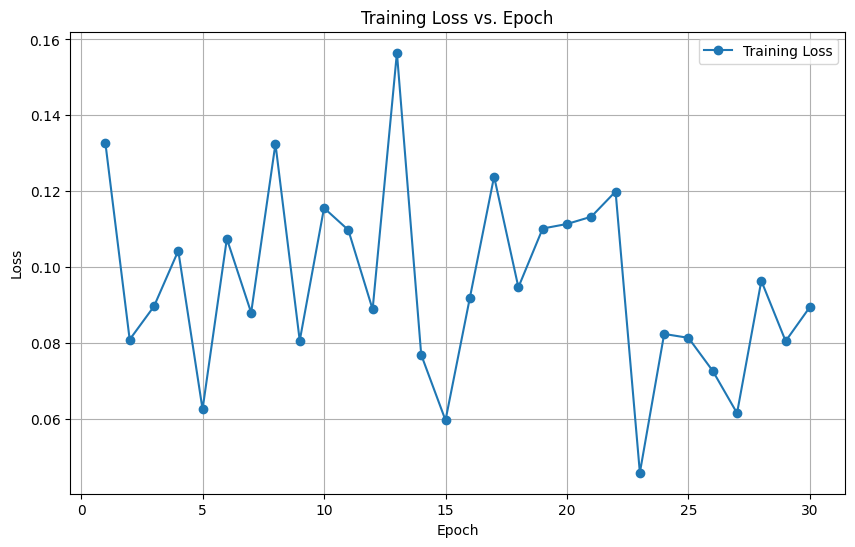

In [ ]:
import matplotlib.pyplot as plt

# Información del proyecto y la corrida
project_name = "text2image-fine-tune"
run_id = "p5hrmc3r"

# Levantamos datos
api = wandb.Api()
run = api.run(f"leandrosaraco-universidad-de-buenos-aires/{project_name}/{run_id}")

# Obtenemos métricas
history = run.history()
train_loss = history['train_loss']

# Plot
epochs = range(1, len(train_loss) + 1)
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss, marker='o', label="Training Loss")
plt.title("Training Loss vs. Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid()
plt.show()


## Inferencia con modelo fine-tuned

In [ ]:
pipe2 = StableDiffusionPipeline.from_pretrained(vit_tp_dir, torch_dtype=torch.float16)
pipe2 = pipe2.to("cuda")
images = pipe2(prompt, num_images_per_prompt=6).images

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

<Figure size 640x480 with 0 Axes>

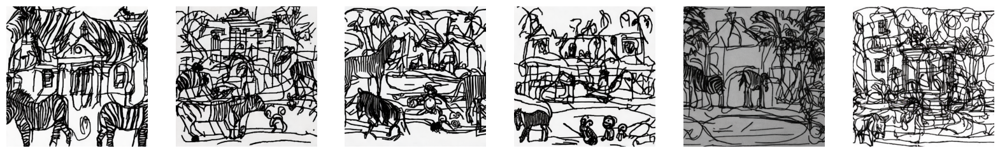

In [ ]:
images_after_ft = images
plot_images(images_after_ft)

## Evaluación

### Cambio de estilo

Volvemos a mostrar las imágenes:

- Primer fila: Antes de aplicar fine tuning.
- Segunda fila: Luego de aplicar fine tuning con el dataset de bosquejos en blanco y negro.

<Figure size 640x480 with 0 Axes>

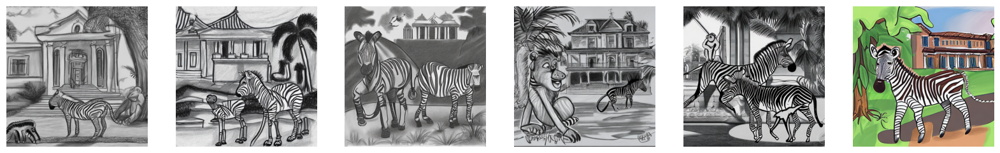

<Figure size 640x480 with 0 Axes>

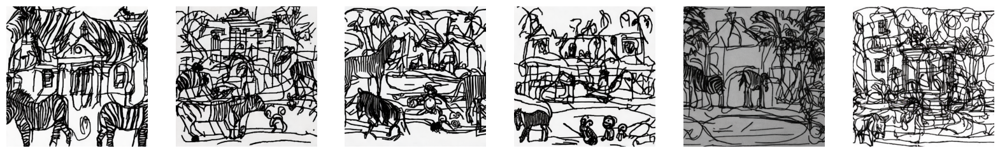

In [ ]:
plot_images(images_before_ft)
plot_images(images_after_ft)

Vemos que el cambio de estilo es evidente. Ahora se utilizará CLIP para obtener una métrica de similitud entre las imágenes producidas VS las etiquetas que se encuentran en el dataset de entrenamiento

### Utilizando CLIP

- Se usa CLIP para generar embeddings del prompt y de las imágenes.
- Se compara similutd de ambos embeddings usando similitud coseno.

In [ ]:
from transformers import CLIPProcessor, CLIPModel
import torch.nn.functional as F

model_CLIP = CLIPModel.from_pretrained('openai/clip-vit-base-patch32')
processor_CLIP = CLIPProcessor.from_pretrained('openai/clip-vit-base-patch32')

def evaluacion_CLIP(modelo,processor,prompt,imagenes):
  """
  Evalua la similitud coseno entre embeddings del prompt e imagenes.
  USO: evaluacion_CLIP(model_CLIP,processor_CLIP, prompt,images)
  """
  inputs = processor(text=prompt, images=imagenes, return_tensors="pt", padding=True)
  outputs = modelo(**inputs)
  image_embeds = outputs.image_embeds  # Image embeddings
  text_embeds = outputs.text_embeds    # Text embeddings

  # Normalizamos los embeddings
  image_embeds = F.normalize(image_embeds, p=2, dim=-1)
  text_embeds = F.normalize(text_embeds, p=2, dim=-1)

  # Calculo de similitud coseno
  similarity = torch.matmul(image_embeds, text_embeds.T)  # Shape: [1, 1]
  for i,sim in enumerate(similarity):
    print(f"Similitud de la imagen {i+1}: {sim.item()}")
  return similarity

config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

- Se generan 6 imágenes por prompt.
- Se carga una lista de prompts extraídos de las etiquetas del dataset.
- Se comparan resultados utilizando un "pre-prompt" que indica estilo.
- Se obtiene una métrica de similitud promedio.


> Nota: Idealmente este proceso debería hacerse con todas las etiquetas del dataset utilizado para finetuning (así se obtendría un número más representativo). Utilizamos sólo algunas de ellas por las limitaciones de tiempo de GPU de Colab.

In [ ]:
prompts = [
        "a boy is practicing martial arts",
        "a statue of a man on horse",
        "a boy is riding bike on the road",
        "giraffe standing in a forest",
        "zebra running",
           ]
pre_prompt = "A black and white sketch of "

Prompt: A black and white sketch of A boy is practicing martial arts


  0%|          | 0/50 [00:00<?, ?it/s]

Similitud de la imagen 1: 0.36479148268699646
Similitud de la imagen 2: 0.36678844690322876
Similitud de la imagen 3: 0.36978697776794434
Similitud de la imagen 4: 0.41995522379875183
Similitud de la imagen 5: 0.3895121216773987
Similitud de la imagen 6: 0.3302789032459259
Similitud coseno (promedio): 37.352%


<Figure size 640x480 with 0 Axes>

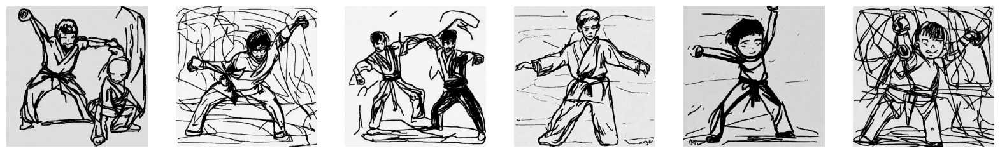

Prompt: A black and white sketch of A statue of a man on horse


  0%|          | 0/50 [00:00<?, ?it/s]

Similitud de la imagen 1: 0.3606291115283966
Similitud de la imagen 2: 0.3926561176776886
Similitud de la imagen 3: 0.386467307806015
Similitud de la imagen 4: 0.34073561429977417
Similitud de la imagen 5: 0.351676344871521
Similitud de la imagen 6: 0.3457701802253723
Similitud coseno (promedio): 36.299%


<Figure size 640x480 with 0 Axes>

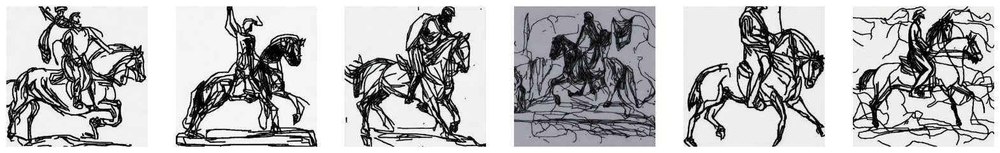

Prompt: A black and white sketch of A boy is riding bike on the road


  0%|          | 0/50 [00:00<?, ?it/s]

Similitud de la imagen 1: 0.3515739142894745
Similitud de la imagen 2: 0.3644255995750427
Similitud de la imagen 3: 0.34974727034568787
Similitud de la imagen 4: 0.3747219443321228
Similitud de la imagen 5: 0.34044450521469116
Similitud de la imagen 6: 0.3705085515975952
Similitud coseno (promedio): 35.857%


<Figure size 640x480 with 0 Axes>

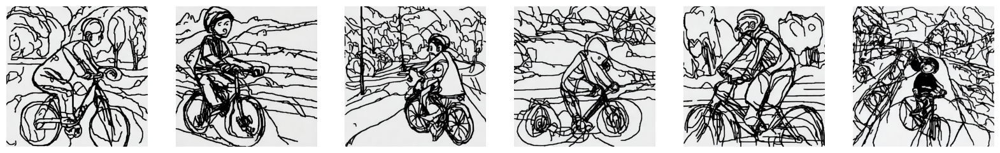

Prompt: A black and white sketch of Giraffe standing in a forest


  0%|          | 0/50 [00:00<?, ?it/s]

Similitud de la imagen 1: 0.3090103566646576
Similitud de la imagen 2: 0.36480969190597534
Similitud de la imagen 3: 0.38902929425239563
Similitud de la imagen 4: 0.3593354821205139
Similitud de la imagen 5: 0.37472474575042725
Similitud de la imagen 6: 0.3689088821411133
Similitud coseno (promedio): 36.097%


<Figure size 640x480 with 0 Axes>

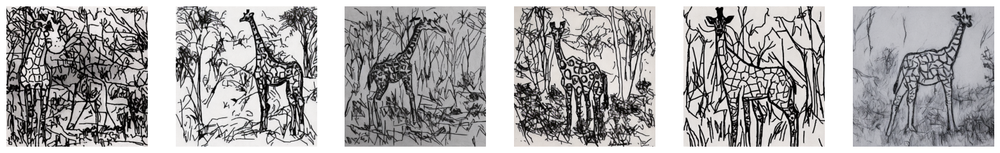

Prompt: A black and white sketch of zebra running


  0%|          | 0/50 [00:00<?, ?it/s]

Similitud de la imagen 1: 0.36435219645500183
Similitud de la imagen 2: 0.38401323556900024
Similitud de la imagen 3: 0.3450744152069092
Similitud de la imagen 4: 0.36687764525413513
Similitud de la imagen 5: 0.3646918833255768
Similitud de la imagen 6: 0.385182648897171
Similitud coseno (promedio): 36.837%


<Figure size 640x480 with 0 Axes>

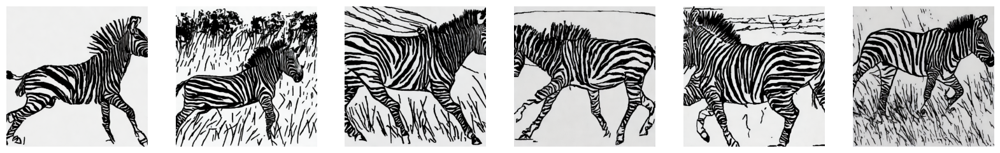

In [ ]:
results = []

for prompt in prompts:
  # Le agregamos al prompt el pre-prompt para introducir noción del estilo
  prompt = pre_prompt + prompt
  print(f"Prompt: {prompt}")
  # Generamos las imágenes
  images = pipe2(prompt, num_images_per_prompt=6).images
  # Evaluamos con clip
  sim = evaluacion_CLIP(model_CLIP,processor_CLIP,prompt,images).mean().item()
  # Prints y plots
  print(f"Similitud coseno (promedio): {sim*100:.3f}%")
  results_dict = { "prompt":prompt, "images":images,"sim":sim}
  results.append(results_dict)
  plot_images(images)

Repetimos la misma evaluación pero ahora pre-poniendo el texto de estilo sólo en la evaluación de CLIP:

Prompt: A boy is practicing martial arts


  0%|          | 0/50 [00:00<?, ?it/s]

Similitud de la imagen 1: 0.35858815908432007
Similitud de la imagen 2: 0.34524405002593994
Similitud de la imagen 3: 0.3543238043785095
Similitud de la imagen 4: 0.3619195222854614
Similitud de la imagen 5: 0.36968883872032166
Similitud de la imagen 6: 0.349448561668396
Similitud coseno (promedio): 35.654%


<Figure size 640x480 with 0 Axes>

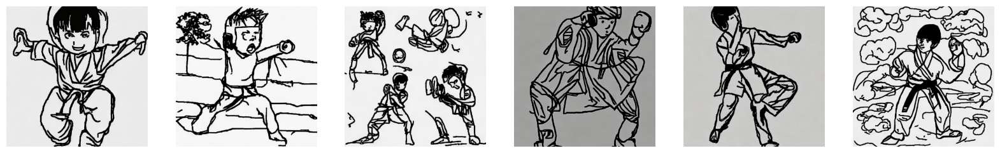

Prompt: A statue of a man on horse


  0%|          | 0/50 [00:00<?, ?it/s]

Similitud de la imagen 1: 0.2716825604438782
Similitud de la imagen 2: 0.29550865292549133
Similitud de la imagen 3: 0.30787336826324463
Similitud de la imagen 4: 0.3169911205768585
Similitud de la imagen 5: 0.32062989473342896
Similitud de la imagen 6: 0.3008095622062683
Similitud coseno (promedio): 30.225%


<Figure size 640x480 with 0 Axes>

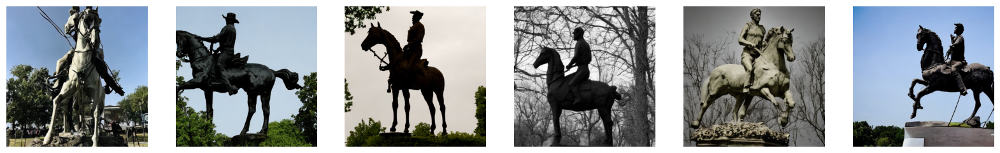

Prompt: A boy is riding bike on the road


  0%|          | 0/50 [00:00<?, ?it/s]

Similitud de la imagen 1: 0.3795011639595032
Similitud de la imagen 2: 0.3299931585788727
Similitud de la imagen 3: 0.35904520750045776
Similitud de la imagen 4: 0.32629698514938354
Similitud de la imagen 5: 0.34554821252822876
Similitud de la imagen 6: 0.3118659257888794
Similitud coseno (promedio): 34.204%


<Figure size 640x480 with 0 Axes>

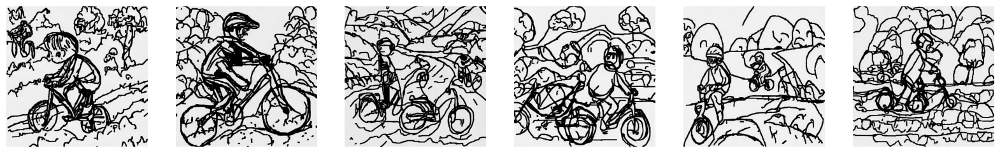

Prompt: Giraffe standing in a forest


  0%|          | 0/50 [00:00<?, ?it/s]

Similitud de la imagen 1: 0.33166414499282837
Similitud de la imagen 2: 0.29907944798469543
Similitud de la imagen 3: 0.35021910071372986
Similitud de la imagen 4: 0.32920926809310913
Similitud de la imagen 5: 0.29148876667022705
Similitud de la imagen 6: 0.3627636432647705
Similitud coseno (promedio): 32.740%


<Figure size 640x480 with 0 Axes>

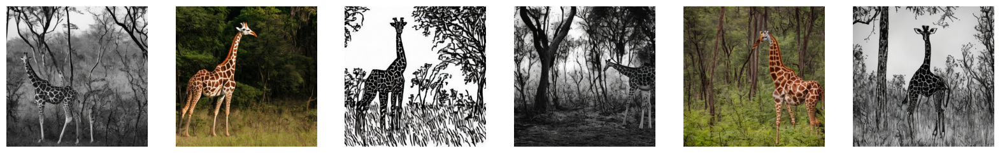

Prompt: zebra running


  0%|          | 0/50 [00:00<?, ?it/s]

Similitud de la imagen 1: 0.36427170038223267
Similitud de la imagen 2: 0.3398086130619049
Similitud de la imagen 3: 0.33122318983078003
Similitud de la imagen 4: 0.34858596324920654
Similitud de la imagen 5: 0.3686044216156006
Similitud de la imagen 6: 0.35337135195732117
Similitud coseno (promedio): 35.098%


<Figure size 640x480 with 0 Axes>

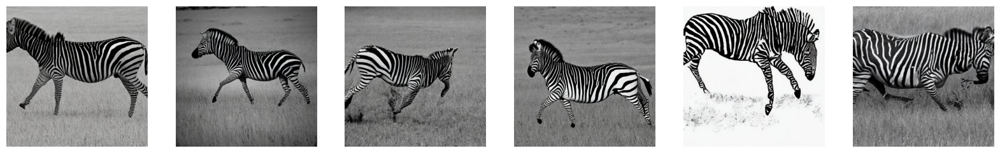

In [ ]:
results_without_pre_prompt = []

for prompt in prompts:
  # Le agregamos al prompt el pre-prompt para introducir noción del estilo
  print(f"Prompt: {prompt}")
  # Generamos las imágenes
  images = pipe2(prompt, num_images_per_prompt=6).images
  # Evaluamos con clip
  prompt_clip = pre_prompt + prompt
  sim = evaluacion_CLIP(model_CLIP,processor_CLIP,prompt_clip,images).mean().item()
  # Prints y plots
  print(f"Similitud coseno (promedio): {sim*100:.3f}%")
  results_dict = { "prompt":prompt, "images":images,"sim":sim}
  results_without_pre_prompt.append(results_dict)
  plot_images(images)

Con estos datos calculamos una métrica de similitud promedio de ambas pruebas

In [ ]:
mn = 0
for res in results:
  mn += res["sim"]
mn = mn / len(results)
print(f"Similitud promedio con pre-prompt: {mn*100:.3f}%")

mn = 0
for res in results_without_pre_prompt:
  mn += res["sim"]
mn = mn / len(results_without_pre_prompt)
print(f"Similitud promedio sin pre-prompt: {mn*100:.3f}%")

Similitud promedio con pre-prompt: 36.488%
Similitud promedio sin pre-prompt: 33.584%


- Puede observarse que agregar "A black and white sketch of ..." antes del prompt ayuda a obtener el estilo deseado.
- Mediante la similitud calculada usando CLIP se respalda lo que observamos.

### Utilizando BLIP


- BLIP (Bootstrapped Language-Image Pretraining) permite generar directamente un texto a partir de una imagen.

- Se genera un texto por cada imagen para evaluar

- Se utiliza para validar manualmente si el pie de imagen generado por BLIP coincide con el prompt indicado en la generación de imágenes.

In [ ]:
from transformers import BlipProcessor, BlipForConditionalGeneration

# Load model and processor
model_BLIP = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")
processor_BLIP = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")

def evaluacion_BLIP(modelo,processor,imagenes,silent = True):
  """
  Genera un texto a partir de una imagen.
  USO: evaluacion_BLIP(model_BLIP,processor_BLIP,images)
  """
  inputs = processor(images=imagenes, return_tensors="pt", padding=True)
  outputs = modelo.generate(**inputs, max_new_tokens=40)

  captions = [processor.decode(output, skip_special_tokens=True) for output in outputs]

  # Se imprimen los textos generados a partir de las imágenes
  if not silent:
    for i,caption in enumerate(captions):
        print(f"Imagen: {i+1} | Caption: {caption}")
  return captions


Ahora evaluaremos con BLIP las imágenes generadas en la sección anterior

Prompt original: A black and white sketch of A boy is practicing martial arts
Caption según BLIP (imagen 1): a drawing of two people in karate stance
Caption según BLIP (imagen 2): a drawing of a man in karate stance
Caption según BLIP (imagen 3): a drawing of two men fighting
Caption según BLIP (imagen 4): a drawing of a man in karate gear
Caption según BLIP (imagen 5): a drawing of a person holding a baseball bat
Caption según BLIP (imagen 6): a drawing of two people sitting on a couch


<Figure size 640x480 with 0 Axes>

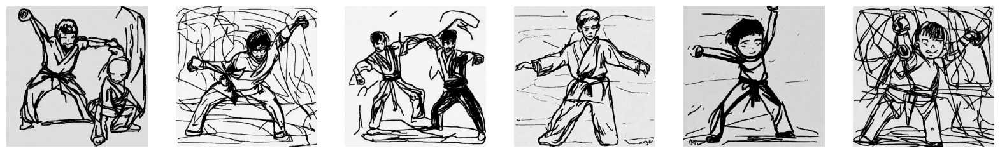

Prompt original: A black and white sketch of A statue of a man on horse
Caption según BLIP (imagen 1): a drawing of a horse and rider
Caption según BLIP (imagen 2): a drawing of a horse and rider
Caption según BLIP (imagen 3): a drawing of a horse and rider
Caption según BLIP (imagen 4): a drawing of a horse and rider
Caption según BLIP (imagen 5): a drawing of a man riding a horse
Caption según BLIP (imagen 6): a drawing of a horse and rider


<Figure size 640x480 with 0 Axes>

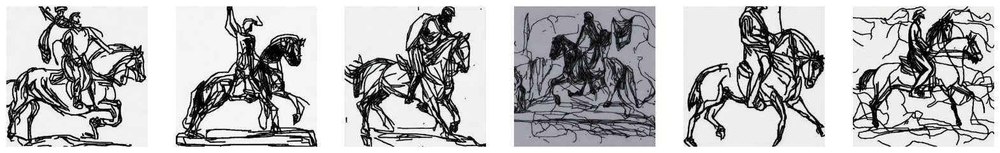

Prompt original: A black and white sketch of A boy is riding bike on the road
Caption según BLIP (imagen 1): a drawing of a man riding a bike
Caption según BLIP (imagen 2): a drawing of a person riding a bike
Caption según BLIP (imagen 3): a drawing of a person riding a bike
Caption según BLIP (imagen 4): a drawing of a man riding a bike
Caption según BLIP (imagen 5): a drawing of a man riding a horse
Caption según BLIP (imagen 6): a drawing of a man riding a bike


<Figure size 640x480 with 0 Axes>

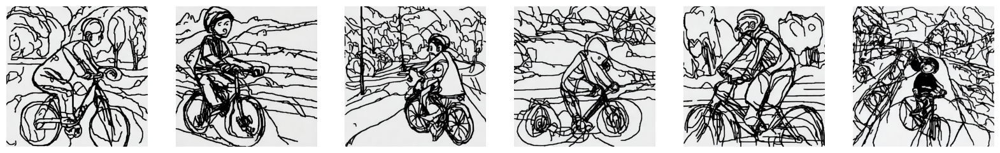

Prompt original: A black and white sketch of Giraffe standing in a forest
Caption según BLIP (imagen 1): a drawing of a group of people
Caption según BLIP (imagen 2): a drawing of a gi in the wild
Caption según BLIP (imagen 3): a drawing of a gi in the middle of a field
Caption según BLIP (imagen 4): a drawing of a tree with a lot of leaves
Caption según BLIP (imagen 5): a drawing of a gifefefefefefefefefefefefefefefefe
Caption según BLIP (imagen 6): a drawing of a gi in the grass


<Figure size 640x480 with 0 Axes>

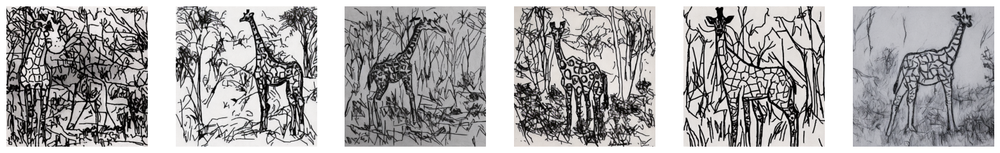

Prompt original: A black and white sketch of zebra running
Caption según BLIP (imagen 1): a zebra running in the air
Caption según BLIP (imagen 2): a zebra is walking through the grass
Caption según BLIP (imagen 3): a zebra running through the grass
Caption según BLIP (imagen 4): a zebra walking across a white surface
Caption según BLIP (imagen 5): a zebra running in the wild
Caption según BLIP (imagen 6): a zebra running through the grass in the wild


<Figure size 640x480 with 0 Axes>

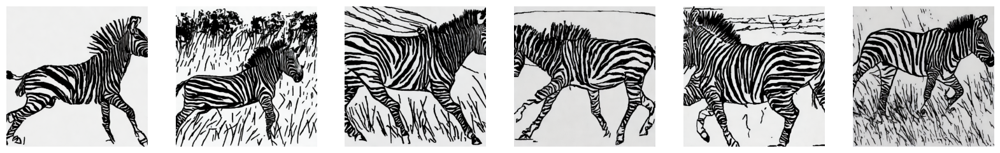

In [ ]:
for res in results:
  print(f"Prompt original: {res['prompt']}")
  captions_blip = evaluacion_BLIP(model_BLIP,processor_BLIP,res["images"])
  for i,cap in enumerate(captions_blip):
    print(f"Caption según BLIP (imagen {i+1}): {cap}")
  plot_images(res["images"])

- Vemos que en todos los casos BLIP expresa la imagen como "A drawing of", lo que comprueba que se obtuvo el estilo deseado

- En los casos donde el dibujo es confuso o posee muchas líneas se ven alucinaciones o salidas sin sentido.

Para contrastar, utilizaremos BLIP en las imágenes generadas antes de finetuning:

In [ ]:
evaluacion_BLIP(model_BLIP,processor_BLIP, images_before_ft)

## Conclusiones

- Entrenar un modelo de generación de imágenes a texto es una tarea que consume muchos recursos computacionales, especialmente VRAM.
  - A través de optimizaciones como el uso de _half precision_ (fp16) y Adam en 8 bits, es posible reducir drásticamente el consumo de memoria.
- El modelo Stable Difussion Base pre-entrenado posee una buen desempeño pero el fine tuning muestra que es posible refinar el modelo para que se adapte a una tarea específica.
  - En este caso, es bastante notorio el cambio de estilo pre y pos finetuning.
- A través del uso de modelos como CLIP es posible obtener una métrica objetiva de qué tan bien se desempeña el modelo en la tarea requerida.
  - Además, el uso de BLIP ayuda a confirmar que es posible captar el cambio de estilo a través de un modelo de IA.
- A partir de librerías de HugginFace puede realizarse inferencia y entrenamiento de modelos basados en difusión de manera sencilla.